# Image Super Sampling

## Using Generative Adversarial Network

https://arxiv.org/abs/1609.04802

https://arxiv.org/abs/2102.01582

In [1]:
import os
from tqdm import tqdm
import numpy as np # Can possibly remove dependency
import matplotlib.pyplot as plt

import torch
from torch import nn
from torchvision import transforms, models
from torchvision.io import read_image
from torch.utils.data import Dataset, DataLoader
from torch.utils.tensorboard import SummaryWriter
#from torchview import draw_graph

In [2]:
# Enable GPU
device = 'cuda' if torch.cuda.is_available() else 'cpu'

## Image Dimensions

The generator upscales images to four times their original resolution (H x W) -> (4H x 4W).<br>
Small resolutions (32 x 32) -> (128 x 128) are used here to keep VRAM and compute power requirements down, but the generator is fully convolutional so it can theoretically be applied to any image resolution. (It should work best at the training resolution though). The upscaling ratio can also be easily changed by adding additional pixelshuffle blocks to the generator.

In [3]:
# Current model is set up to handle scaling factor of 4
large_image_size = 128
small_image_size = large_image_size // 4

# Loading Data

load_single_image is only ever used to load images for evaluating the model performance. It is missing the optimizations present in torch.utils.data.Dataset as well as the transformations applied to images for training.

In [4]:
def load_single_image(directory, image_number):
    
    files = sorted(os.listdir(directory))

    # Image data is scaled to float between 0 and 1
    full_res_image = read_image(directory + files[image_number])/255
    large_image = transforms.Resize((large_image_size,large_image_size), 
                                    antialias = False)(full_res_image)
    small_image = transforms.Resize((small_image_size, small_image_size), 
                                    antialias = False)(full_res_image)
    
    return small_image, large_image

ImageDataset is used to load images during training. The images in the training dataset are already the correct size for the high resolution images (128 x 128), so they only need to be scaled down to the size for the low resolution images (32 x 32). Images are also flipped horizontally and vertically at random to add further variety to the training data.

In [5]:
class ImageDataset(Dataset):

    def __init__(self, directory):

        super().__init__()
        self.directory = directory
        self.files = os.listdir(directory)

    def __len__(self):
        
        return len(self.files)

    def __getitem__(self, index):

        # Image data is scaled to float between 0 and 1 
        full_res_image = read_image(self.directory + '/' + self.files[index])/255

        # Flip both horizontally and vertically to prevent overfitting
        # Apply transformations to large image before cropping to small image so both have
        # the same transformations
        large_image = transforms.Resize((large_image_size,large_image_size),antialias = False)(full_res_image)
        large_image = transforms.RandomVerticalFlip()(large_image)
        large_image = transforms.RandomHorizontalFlip()(large_image)

        small_image = transforms.Resize((small_image_size, small_image_size), antialias = False)(large_image)
        
        return small_image, large_image

# Training Dataset

The dataset used is [<a href=https://www.kaggle.com/datasets/rhtsingh/google-universal-image-embeddings-128x128#> 130k Images (128x128) - Universal Image Embeddings</a>] found on Kaggle, specifically the landmark section containing 33,063 images. These images were divided into a training set containing 33,000 images, and a test set containing the remaining 63 images. While typically it would be beneficial to have a larger test set, the main measure of success in this case is visual (MSE content loss is secondary) so it is only important to have enough images in the test set to sample visually or create a survey. Example training images are shown below.

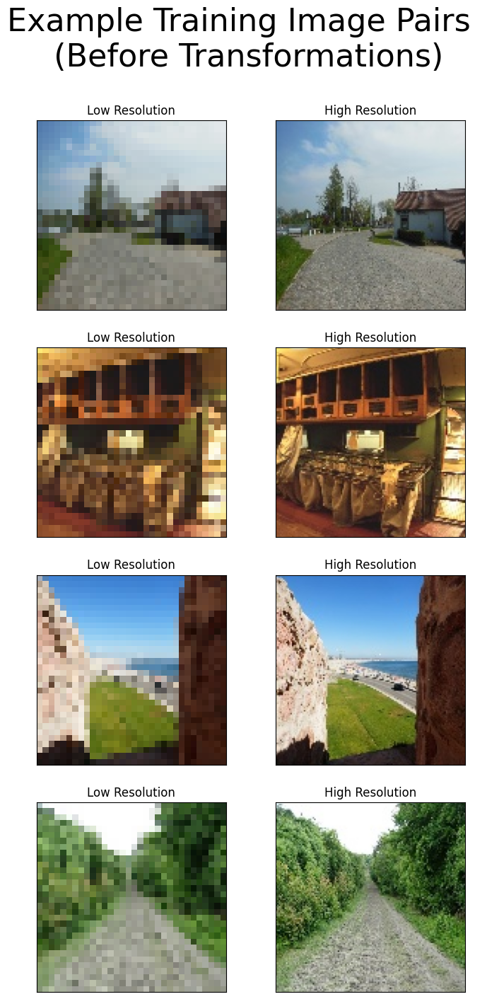

In [6]:
fig, ax = plt.subplots(4,2,figsize=(8, 16))
fig.suptitle('Example Training Image Pairs \n (Before Transformations)', fontsize=32)

for image_number, row in enumerate(ax):
  
    small_image, large_image = load_single_image('../UIE/Train/', image_number)
    small_image = torch.movedim(small_image,0,-1)
    large_image = torch.movedim(large_image,0,-1)
    
    row[0].imshow(small_image)
    row[0].set_xticks([])
    row[0].set_yticks([])
    row[0].set_title('Low Resolution')

    row[1].imshow(large_image)
    row[1].set_xticks([])
    row[1].set_yticks([])
    row[1].set_title('High Resolution')

This cell creates the dataset and iterator to load the data while training.

In [7]:
train_dataset = ImageDataset('../UIE/Train/')
train_dataloader = DataLoader(train_dataset, batch_size = 100, shuffle=True)

# Generator

## Residual Blocks

Convolutional blocks with residual connections make up a large part of the generator. They extract the features to be upscaled from the input images. Their architecture is shown in the diagram below.

<p style='color:red'>Image of Residual Block</p>

In [8]:
class ResidualBlock(nn.Module):

    def __init__(self):
           
        super().__init__()
        self.conv0 = nn.Conv2d(in_channels = 64,
                               out_channels = 64,
                               kernel_size = 3,
                               padding = 1)
        self.norm0 = nn.BatchNorm2d(num_features = 64)
        self.act0 = nn.PReLU()
        self.conv1 = nn.Conv2d(in_channels = 64,
                               out_channels = 64,
                               kernel_size = 3,
                               padding = 1)
        self.norm1 = nn.BatchNorm2d(num_features = 64)

    def forward(self, x):

        block = self.conv0(x)
        block = self.norm0(block)
        block = self.act0(block)
        block = self.conv1(block)
        block = self.norm1(block)
        block = torch.add(x, block)

        return block        

## Shuffle Blocks

(Pixel)Shuffle blocks are the other important component of the generator as they handle the change in resolution of the images. Pixelshuffle layers are used in place of transposed convolutional layers to avoid checkerboard artifcating in the upscaled images. Their architecture is shown in the diagram below.

<p style='color:red'>Image of Shuffle Block</p>

In [9]:
class ShuffleBlock(nn.Module):

    def __init__(self):
           
        super().__init__()
        self.conv = nn.Conv2d(in_channels = 64,
                              out_channels = 256,
                              kernel_size = 3,
                              padding = 1)
        self.pixelshuffle = nn.PixelShuffle(2)
        self.act = nn.PReLU()

    def forward(self, x):

        block = self.conv(x)
        block = self.pixelshuffle(block)
        block = self.act(block)

        return block

In [10]:
class Generator(nn.Module):

    def __init__(self):

        super().__init__()
        self.conv0 = nn.Conv2d(in_channels = 3,
                               out_channels = 64,
                               kernel_size = 3,
                               padding = 1)
        self.act0 = nn.PReLU()
        self.conv1 = nn.Conv2d(in_channels = 64,
                               out_channels = 64,
                               kernel_size = 3,
                               padding = 1)
        self.norm1 = nn.BatchNorm2d(num_features = 64)
        self.residuals = nn.Sequential(
            *[ResidualBlock() for _ in range(8)])
        self.shuf0 = ShuffleBlock()
        self.shuf1 = ShuffleBlock()
        self.conv2 = nn.Conv2d(in_channels = 64,
                       out_channels = 3,
                       kernel_size = 9,
                       padding = 4)
        self.act1 = nn.Sigmoid()
    
    def forward(self, x):

        pre_block = self.conv0(x)
        pre_block = self.act0(pre_block)
        block = self.residuals(pre_block)
        block = self.conv1(block)
        block = self.norm1(block)
        block = torch.add(pre_block, block)
        block = self.shuf0(block)
        block = self.shuf1(block)
        block = self.conv2(block)
        block = self.act1(block)

        return block        

    def supersample(self, x):

        output = self.forward(x.to(torch.float))
        output = torch.squeeze(output)

        return output

In [11]:
class DiscBlock(nn.Module):

    def __init__(self, in_filters, out_filters, stride):

        super().__init__()
        self.conv = nn.Conv2d(in_channels = in_filters,
                              out_channels = out_filters,
                              kernel_size = 3,
                              padding = 1,
                              stride = stride)
        self.norm = nn.BatchNorm2d(num_features = out_filters)
        self.act = nn.LeakyReLU(0.1)

    def forward(self, x):

        block = self.conv(x)
        block = self.norm(block)
        block = self.act(block)

        return block

In [12]:
class Discriminator(nn.Module):

    def __init__(self):

        super().__init__() 
        self.conv0 = nn.Conv2d(in_channels = 3,
                               out_channels = 64,
                               kernel_size = 3,
                               padding = 1)
        self.act0 = nn.LeakyReLU(0.1)
        self.convblock0 = DiscBlock(in_filters = 64,
                                   out_filters = 64,
                                   stride = 2)
        self.convblock1 = DiscBlock(in_filters = 64,
                                   out_filters = 128,
                                   stride = 1)
        self.convblock2 = DiscBlock(in_filters = 128,
                                   out_filters = 128,
                                   stride = 2)
        self.convblock3 = DiscBlock(in_filters = 128,
                                   out_filters = 256,
                                   stride = 1)
        self.convblock4 = DiscBlock(in_filters = 256,
                                   out_filters = 256,
                                   stride = 2)
        '''
        self.convblock5 = DiscBlock(in_filters = 256,
                                   out_filters = 512,
                                   stride = 1)
        self.convblock6 = DiscBlock(in_filters = 512,
                                   out_filters = 512,
                                   stride = 2)
        '''
        self.flatten = nn.Flatten()
        self.dense0 = nn.LazyLinear(1024)
        self.act1 = nn.LeakyReLU(0.1)
        self.dense1 = nn.LazyLinear(1)
        self.act2 = nn.Sigmoid()

    def forward(self, x):

        block = self.conv0(x)
        block = self.act0(block)
        block = self.convblock0(block)
        block = self.convblock1(block)
        block = self.convblock2(block)
        block = self.convblock3(block)
        block = self.convblock4(block)
        #block = self.convblock5(block)
        #block = self.convblock6(block)
        block = self.flatten(block)
        block = self.dense0(block)
        block = self.act1(block)
        block = self.dense1(block)
        block = self.act2(block)

        return block

In [13]:
# First 18 layers because smaller images?
vgg = models.vgg19(weights='DEFAULT').features.to(device)
for param in vgg.parameters():
    param.requires_grad = False

In [14]:
generator = Generator()
generator.to(device)
generator_optimizer = torch.optim.Adam(generator.parameters(), lr = 1e-4)

discriminator = Discriminator()
discriminator.to(device)
discriminator_optimizer = torch.optim.Adam(discriminator.parameters(), lr = 1e-4)

/home/jason/torch/lib/python3.11/site-packages/torch/nn/modules/lazy.py:180: UserWarning: Lazy modules are a new feature under heavy development so changes to the API or functionality can happen at any moment.
  warnings.warn('Lazy modules are a new feature under heavy development '


In [15]:
tbwriter = SummaryWriter(log_dir='runs/gan')

In [16]:
def train_step(epoch):

    train_data_iterator = iter(train_dataloader)
    for step, (x, y) in enumerate(train_data_iterator):

        log_step = epoch * len(train_dataloader) + step

        x, y = x.to(device), y.to(device)
        
        discriminator_optimizer.zero_grad()
        fake_images = generator(x)
        discriminator_fake_predictions = torch.mean(discriminator(fake_images))
        discriminator_real_predictions = torch.mean(discriminator(y))
        disc_loss = discriminator_fake_predictions + 1 - discriminator_real_predictions
        
        disc_loss.backward()          
        discriminator_optimizer.step()
        tbwriter.add_scalars('discriminator',{'Real':1 - discriminator_real_predictions,
                                              'Fake':discriminator_fake_predictions,
                                              'Total':disc_loss},
                                         log_step)

        generator_optimizer.zero_grad()
        adv_scaler = 0.01
        mse_scaler = 1
        vgg_scaler = 0.02

        generated_images = generator.forward(x)  
        mse_loss = nn.functional.mse_loss(generated_images, y) * mse_scaler
        vgg_loss = nn.functional.mse_loss(vgg(generated_images), vgg(y)) * vgg_scaler         
        adversarial_loss = (1 - torch.mean(discriminator(generated_images))) * adv_scaler

        (mse_loss + vgg_loss + adversarial_loss).backward()
        generator_optimizer.step()
        tbwriter.add_scalars('generator',{'MSE':mse_loss,
                                          'VGG':vgg_loss,
                                          'Adv':adversarial_loss,
                                          'Total':mse_loss + vgg_loss + adversarial_loss},
                                        log_step)

    if epoch % 1 == 0: 
        with torch.no_grad():
            small, large = load_single_image('../UIE/Train/', 12)
            example = generator.supersample(torch.unsqueeze(small,0).to(device)).detach().to('cpu')
            example = torch.squeeze(example)
            tbwriter.add_image('SuperSampled', example, epoch, dataformats='CHW')

In [17]:
for epoch in tqdm(range(3)):
    train_step(epoch)

100%|████████████████████████████████████████████████████████████████████| 3/3 [18:23<00:00, 367.82s/it]


In [18]:
#torch.save(generator, './models/generator.pt')
#torch.save(discriminator, './models/discriminator.pt')
#generator = torch.load('./models/Faces50/generator.pt')
#discriminator = torch.load('./models/Faces50/discriminator.pt')

In [19]:
generator.eval();

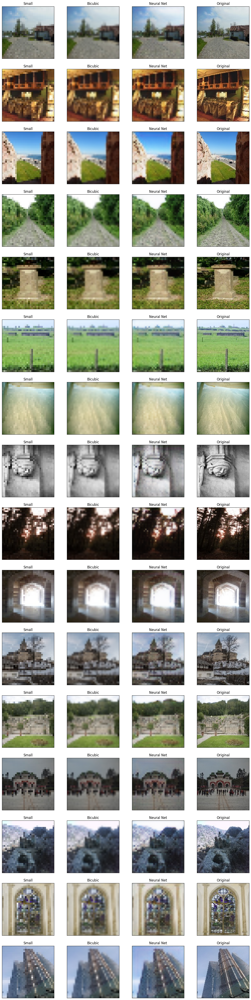

In [20]:
fig, ax = plt.subplots(16, 4, figsize=(16,64))
for image in range(16):
    for index, axis in enumerate(ax):
        small, large = load_single_image('../UIE/Train/', index)
        
        bicubic = transforms.functional.resize(small,large_image_size,antialias=True)
        generated = generator.supersample(torch.unsqueeze(small,0).to(device)).to('cpu')
        generated = generated.detach().numpy()
        generated = np.moveaxis(np.squeeze(generated),0,-1)
        
        small = torch.movedim(small,0,-1)
        large = torch.movedim(large,0,-1) 
        bicubic = torch.movedim(bicubic,0,-1) 
        
        axis[0].imshow(small)
        axis[0].set_title('Small')
        axis[1].imshow(bicubic)
        axis[1].set_title('Bicubic')
        axis[2].imshow(generated)
        axis[2].set_title('Neural Net')
        axis[3].imshow(large)
        axis[3].set_title('Original')

        for image in axis:
            image.set_xticks([])
            image.set_yticks([])

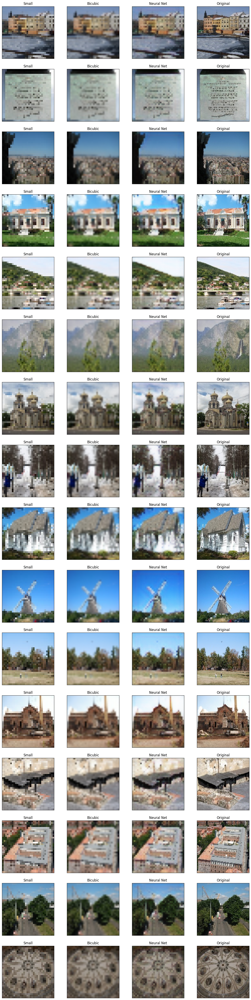

In [21]:
fig, ax = plt.subplots(16,4,figsize=(16,64))
for image in range(16):
    for index, axis in enumerate(ax):
        small, large = load_single_image('../UIE/Test/', index)
        
        bicubic = transforms.functional.resize(small,large_image_size,antialias=True)
        generated = generator.supersample(torch.unsqueeze(small,0).to(device)).to('cpu')
        generated = generated.detach().numpy()
        generated = np.moveaxis(np.squeeze(generated),0,-1)
        
        small = torch.movedim(small,0,-1)
        large = torch.movedim(large,0,-1) 
        bicubic = torch.movedim(bicubic,0,-1) 
        
        axis[0].imshow(small)
        axis[0].set_title('Small')
        axis[1].imshow(bicubic)
        axis[1].set_title('Bicubic')
        axis[2].imshow(generated)
        axis[2].set_title('Neural Net')
        axis[3].imshow(large)
        axis[3].set_title('Original')

        for image in axis:
            image.set_xticks([])
            image.set_yticks([])

In [22]:
#model_graph = draw_graph(generator, input_size=(100, 3, small_image_size, small_image_size),
#                         device=device, expand_nested=True)
#model_graph.visual_graph